In [93]:
###########################################################################
#                           Testing Models                                #
########################################################################### 
def Modeltest(X_test, y_test, y_pred, model, model_name, SVM = False):
    f1 = round(f1_score(y_test, y_pred, average="macro"), 3 )
    print('F1 Score: ', f1)
    ps = round(precision_score(y_test, y_pred, average="macro") * 100, 2 )
    print('precision Score: ', ps)
    rs = round(recall_score(y_test, y_pred, average="macro") * 100, 2 )
    print('Recall Score: ', rs)
    acc_nb = round(metrics.accuracy_score(y_test, y_pred) * 100, 2 )
    print('Total Accuracy: ', acc_nb )
    if SVM == True:
        roc = 'NaN'
    else:
        y_pred = model.predict_proba(X_test)[:, 1]
        roc = round(roc_auc_score(y_test,y_pred), 3 )
        print('ROC AUC Score : ',roc)
        
    score_table[model_name] = [f1, ps, rs, acc_nb, roc]
    score_table.index = ['F1 Score','precision Score','Recall Score','Total Accuracy','ROC_AUC Score']
    return np.array([f1, ps, rs, acc_nb, roc])

from sklearn import metrics
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, accuracy_score, classification_report


from sklearn.metrics import confusion_matrix
def draw_cm(actual, predicted):
    cm = confusion_matrix( actual, predicted, [1,0]).T
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = ["Yes","No"] , yticklabels = ["Yes","No"] )
    plt.ylabel('Predicted')
    plt.xlabel('Actual')
    plt.show()
    
def plot_tree(model):
    # retrieve performance metrics
    results = model.evals_result()
    epochs = len(results['validation_0']['merror'])
    x_axis = range(0, epochs)
    # plot log loss
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['mlogloss'], label='Train')
    ax.plot(x_axis, results['validation_1']['mlogloss'], label='Test')
    ax.legend()
    plt.ylabel('mLog Loss')
    plt.title('Model mLog Loss')
    plt.show()
    # plot classification error
    fig, ax = plt.subplots()
    ax.plot(x_axis, results['validation_0']['merror'], label='Train')
    ax.plot(x_axis, results['validation_1']['merror'], label='Test')
    ax.legend()
    plt.ylabel('Classification Error')
    plt.title('Model Classification Error')
    plt.show()


In [350]:
###########################################################################
#                             All Models                                  #
###########################################################################     
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
# Random Forest Classifier
def randf(X_train, y_train, X_test, y_test):

    # Create a Random Forest Classifier
    rf = RandomForestClassifier()

    # Hyperparameter Optimization
    parameters = {'n_estimators': [4, 6, 9, 10, 15, 25, 50], 
                  'max_features': ['log2', 'sqrt','auto'], 
                  'criterion': ['entropy', 'gini'],
                  'max_depth': [2, 3, 4, 5, 7, 10], 
                  'min_samples_split': [2, 3, 5],
                  'min_samples_leaf': [1, 5, 8]
                 }

    # Run the grid search
    grid_obj = GridSearchCV(rf, parameters)
    grid_obj = grid_obj.fit(X_train, y_train)

    # Set the rf to the best combination of parameters
    rf = grid_obj.best_estimator_
    print(grid_obj.best_params_)
    # Train the model using the training sets 
    rf.fit(X_train,y_train)
    
    # Test
    y_pred = rf.predict(X_test)
    
    # Confusion matrix and test 
    draw_cm(y_test, y_pred)
    Modeltest(X_test, y_test, y_pred, rf, 'Random Forest', SVM = False)
    
    return rf



from xgboost import XGBClassifier, plot_importance
def boost(X_train, y_train, X_test, y_test):
    # eXtreme Gradient Boosting



    # Create a XGB Classifier
    gbm = XGBClassifier(learning_rate=0.02, n_estimators=1000, objective='multi:softmax', silent=True, nthread=1, num_class=5)

    # A parameter grid for XGBoost for Hyperparameter Optimization
    parameters = {
            'min_child_weight': [1, 5, 10],
            'gamma': [0.1, 0.5, 1, 1.5, 2, 5],
            'subsample': [0.6, 0.8, 1.0],
            'colsample_bytree': [0.6, 0.8, 1.0],
            'max_depth': [3, 5, 6, 10]
            }

    # Run the grid search
    grid_obj = GridSearchCV(gbm, parameters)
    grid_obj = grid_obj.fit(X_train, y_train)

    
    # Set the rf to the best combination of parameters
    gbm = grid_obj.best_estimator_

    # Train the model using the training sets
    gbm.fit(X_train, y_train)
    
    # Prediction on test data
    y_pred = gbm.predict(X_test)
    
#     # Confusion matrix and test 
#     draw_cm(y_test, y_pred)
#     Modeltest(X_test, y_test, y_pred, gbm, 'XGBoost GridSearchCV', SVM = False)
    
    return gbm

from sklearn.metrics import precision_score, accuracy_score
import xgboost as xgb
def fast_boost(X_train, y_train, X_test, y_test):
    
        # https://conference.scipy.org/proceedings/scipy2013/pdfs/bergstra_hyperopt.pdf
    from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
    space = {
        'max_depth' : hp.choice('max_depth', range(5, 30, 1)),
        'learning_rate' : hp.quniform('learning_rate', 0.01, 0.5, 0.01),
        'n_estimators' : hp.choice('n_estimators', range(20, 205, 5)),
        'gamma' : hp.quniform('gamma', 0, 0.50, 0.01),
        'min_child_weight' : hp.quniform('min_child_weight', 1, 10, 1),
        'subsample' : hp.quniform('subsample', 0.1, 1, 0.01),
        'colsample_bytree' : hp.quniform('colsample_bytree', 0.1, 1.0, 0.01)}

    from sklearn.model_selection import train_test_split

    def objective(space):
        
        classifier = xgb.XGBClassifier(n_estimators = space['n_estimators'],
                                max_depth = int(space['max_depth']),
                                learning_rate = space['learning_rate'],
                                gamma = space['gamma'],
                                min_child_weight = space['min_child_weight'],
                                subsample = space['subsample'],
                                colsample_bytree = space['colsample_bytree']
                                )

        classifier.fit(X_train, y_train)

        # Applying k-Fold Cross Validation
        from sklearn.model_selection import cross_val_score
        accuracies = cross_val_score(estimator = classifier, X = X_train, y = y_train, cv = 10)
        CrossValMean = accuracies.mean()
        CrossValVar = accuracies.var()
        
        print("CrossValMean:", CrossValMean)
        print("CrossValVar:", CrossValVar)

        return{'loss':1-CrossValMean, 'status': STATUS_OK }


    ###################################################
    trials = Trials()
    best = fmin(fn=objective,
                space=space,
                algo=tpe.suggest,
                max_evals=50,
                trials=trials)

    print("Best: ", best)
    ###################################################

    from xgboost import XGBClassifier
    XGBmodel = XGBClassifier(n_estimators = best['n_estimators'],
                                max_depth = best['max_depth'],
                                learning_rate = best['learning_rate'],
                                gamma = best['gamma'],
                                min_child_weight = best['min_child_weight'],
                                subsample = best['subsample'],
                                colsample_bytree = best['colsample_bytree']
                                )

    XGBmodel.fit(X_train, y_train)

    # Applying k-Fold Cross Validation
    from sklearn.model_selection import cross_val_score
    accuracies = cross_val_score(estimator = XGBmodel, X = X_train, y = y_train, cv = 10)
    CrossValMean = accuracies.mean()
    print("Final CrossValMean: ", CrossValMean)

    CrossValSTD = accuracies.std()
    y_pred = XGBmodel.predict(X_test)
    
#     draw_cm(y_test, y_pred)
    acc_nb = round(metrics.accuracy_score(y_test, y_pred) * 100, 2 )
    print('Total Accuracy: ', acc_nb )
    
    from sklearn.metrics import confusion_matrix
    confusion = confusion_matrix(y_test, y_pred)
    
    print('Confusion Matrix\n')
    print(confusion)

    #importing accuracy_score, precision_score, recall_score, f1_score
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
    print('\nAccuracy: {:.2f}\n'.format(accuracy_score(y_test, y_pred)))

    print('Micro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='micro')))
    print('Micro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='micro')))
    print('Micro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='micro')))

    print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
    print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
    print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))
    
    print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
    print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
    print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))
    
    print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
    print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
    print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))

    print('Weighted Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='weighted')))
    print('Weighted Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='weighted')))
    print('Weighted F1-score: {:.2f}'.format(f1_score(y_test, y_pred, average='weighted')))

    from sklearn.metrics import classification_report
    print('\nClassification Report\n')
    print(classification_report(y_test, y_pred, target_names=['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5']))

    
#     results = Modeltest(X_test, y_test, y_pred, XGBmodel, 'XGBoost hyperopt', SVM = False)
    
    return XGBmodel


In [174]:
###########################################################################
#                          load scaled data                               #
###########################################################################
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

C = pd.read_csv('H:\\Pickles\\0FIXED_DATA\\CrashOnly\\CrashOnly.csv', encoding='latin1', index_col=0)
NC = pd.read_csv('H:\\UGA MASTERS\\Data Base Files\\Full_CP_0.csv', encoding='latin1',)
NC = NC[NC['Crash'] == 0]

C.rename({'Veh_Count': 'Count', 'Road_Occupancy': 'Occupancy', 'MannerOfCo':'Crash'}, axis=1, inplace=True)
cols = ['Wind_Speed', 'Gust', 'Precip_Rate', 'Precip_Accum',
 'Speed', 'Road_Curvature', 'Crash', 'Interchange_Within',
 'Interchange_Diverging', 'Interchange_Merging', 'Count', 'Occupancy',
 'Date1','Time1']
C = C[cols]
NC = NC[cols]

df = pd.concat([NC,C])



df = df[df['Speed'].notna()]
import datetime
df = df[df['Date1'].notna()]
###########################################################################
#                           date to strings                               #
###########################################################################
DEXABLE = (lambda x: str(x))
df['Date1'] = df['Date1'].map(DEXABLE)

###########################################################################
#                        date to days of week                             #
###########################################################################
DATE2DAY = (lambda x: datetime.datetime(int(x[0:4]), int(x[4:6]), int(x[6:8]), 0, 0, 0, 1).weekday())
df['Weekday'] = df['Date1'].map(DATE2DAY)

# --- Numbers to strings --- #
dateconvert = {0:'Monday',1:'Tuesday',2:'Wednesday',3:'Thursday',4:'Friday',5:'Saturday',6:'Sunday'}
def dater(x):
    x = dateconvert[x]
    return x
df['Weekday'] = df['Weekday'].map(dater)

# --- One-hot-cols --- #
def OneHot(NewName, oldName, df, exceptions):
    uniqueL = df[str(oldName)].unique()
    for item in uniqueL:
        if (item in exceptions):
            df[str(NewName) + '_Other'] =  np.where(df[str(oldName)] == str(item), 1, 0)
        else:
            df[str(NewName) + '_' + str(item)] =  np.where(df[str(oldName)] == str(item), 1, 0)
    df = df.drop([str(oldName)], axis = 1)
    return df
df = OneHot('Weekday', 'Weekday', df, [])


###########################################################################
#                               Peak Hours                                #
###########################################################################
def peak_hr(x):
    if 6 < x < 900:
        x = 1
    elif 1600 < x < 1900:
        x = 1
    else:
        x = 0
    return x
df['Peak_hr'] = df['Time1'].map(peak_hr)


###########################################################################
#                              select list                                #
###########################################################################
finalset = ['Wind_Speed', 'Gust', 'Precip_Rate', 'Precip_Accum',
 'Speed', 'Road_Curvature', 'Crash', 'Interchange_Within', 'Peak_hr',
 'Interchange_Diverging', 'Interchange_Merging', 'Count', 'Occupancy',
 'Weekday_Tuesday', 'Weekday_Monday', 'Weekday_Friday','Weekday_Wednesday',
 'Weekday_Sunday', 'Weekday_Thursday','Weekday_Saturday']
df = df[finalset]
df.reset_index(inplace=True, drop=True)

In [343]:
Type = 'Random_ON_80%'
###########################################################################
#                            SKdown Sampled                               #
###########################################################################
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ML DS
path2file = 'H:\\Pickles\\Updated\\Oversample\\'+ Type + '\\'
# R DS
# path2file = 'H:\\Pickles\\RandomSampled\\'+ Type + '\\'

names = ['X_test.csv','y_test.csv', 'Full.csv']
file_obj = open(path2file + names[0], encoding="utf-8")
X = pd.read_csv(file_obj, low_memory=False, index_col=0)
file_obj = open(path2file + names[1], encoding="utf-8")
y = pd.read_csv(file_obj, low_memory=False, index_col=0)

file_obj = open(path2file + names[2], encoding="utf-8")
Full = pd.read_csv(file_obj, low_memory=False, index_col=0)

In [344]:
###########################################################################
#                          Select test data                               #
###########################################################################
TestPool = df[~df.index.isin(Full.index.to_list())]
TestPoolNONCrash = TestPool[TestPool['Crash'] == 0]
Test_Rear_end = TestPool[TestPool['Crash'] == 1]
Test_SSS = TestPool[TestPool['Crash'] == 2]
Test_Angle = TestPool[TestPool['Crash'] == 3]
Test_Single = TestPool[TestPool['Crash'] == 4]

In [345]:
TestNONCrash = TestPoolNONCrash.sample(n=Test_Rear_end.shape[0])
testsetter = pd.concat([TestNONCrash, Test_Rear_end, Test_SSS, Test_Angle, Test_Single])

In [346]:
X_test = testsetter.drop(['Crash'],1)
y_test = testsetter[['Crash']]

X_train = X
y_train = y['Crash']

In [347]:
y_test['Crash'].value_counts()

1    444
0    444
2    222
3     79
4     65
Name: Crash, dtype: int64

In [ ]:
boost = boost(X_train, y_train, X_test, y_test)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


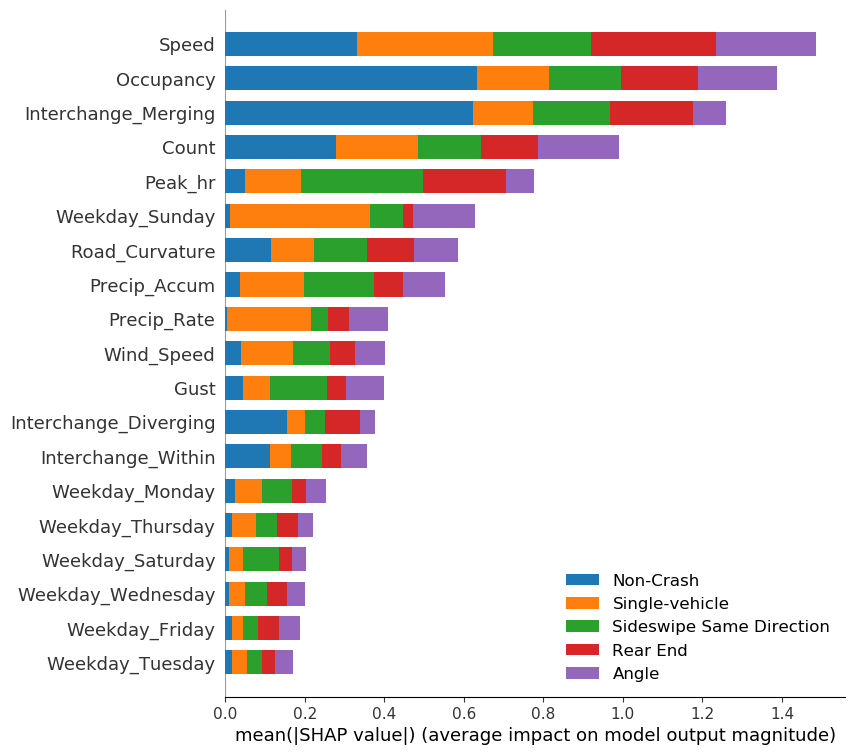

############################################ Class Non-Crash ############################################


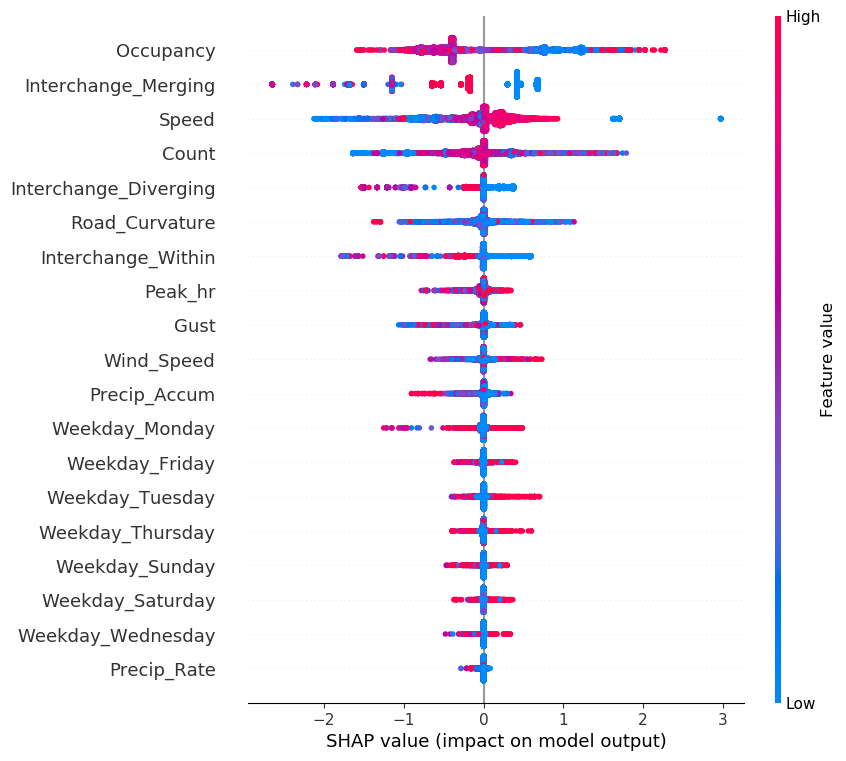

############################################ Class Rear End ############################################


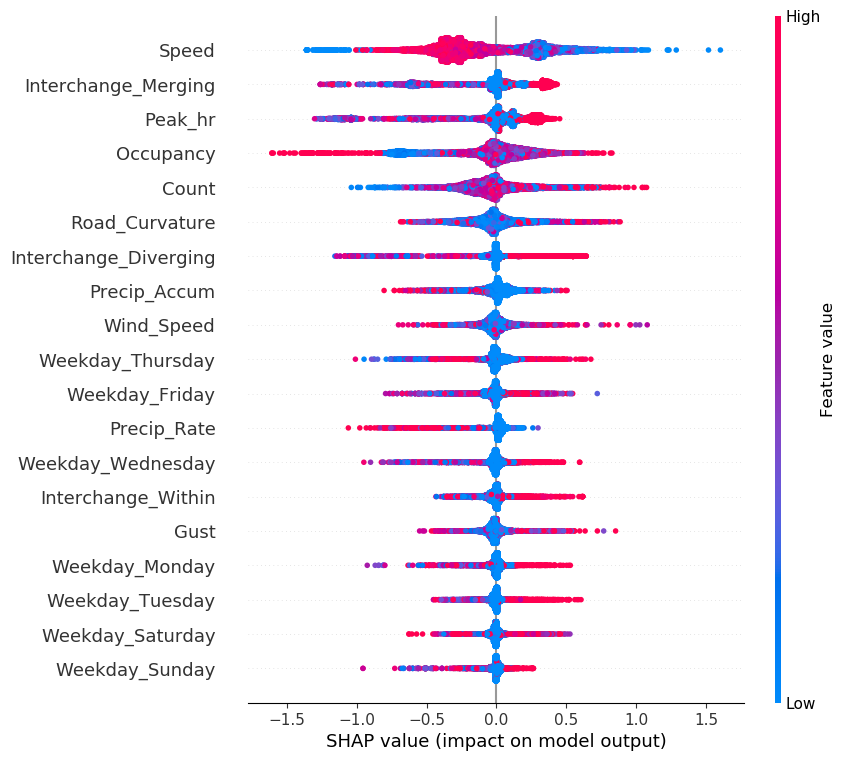

############################################ Class Sideswipe-Same Direction ############################################


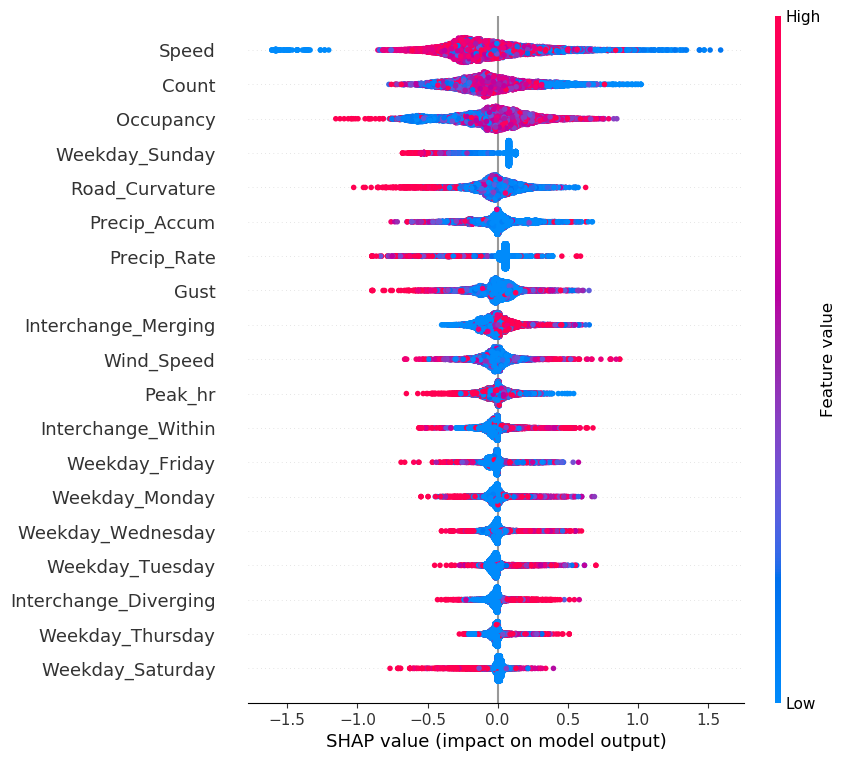

############################################ Class Angle ############################################


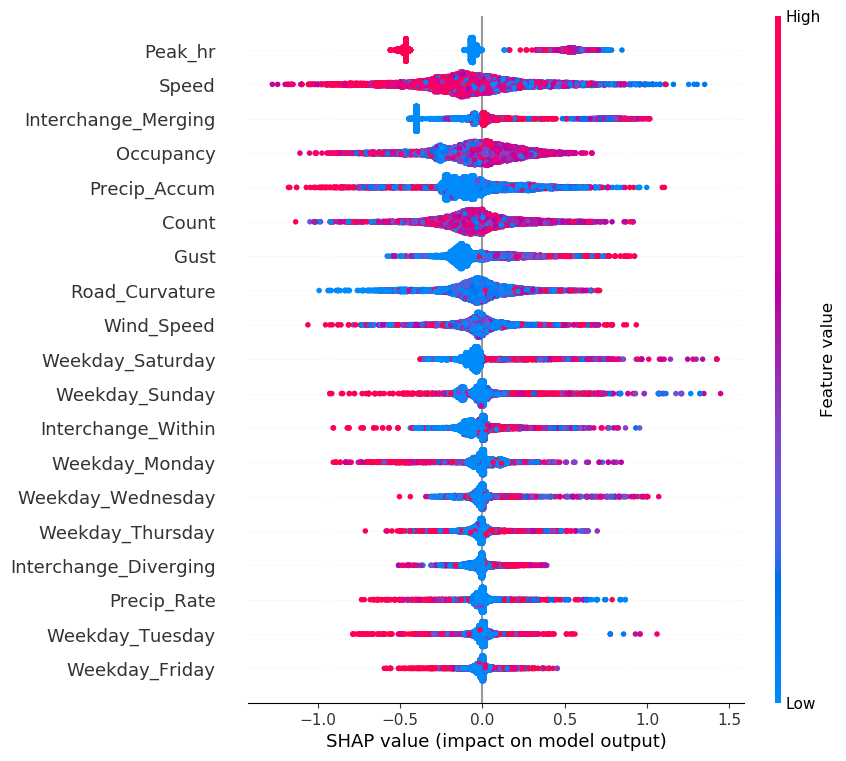

############################################ Class Single-vehicle ############################################


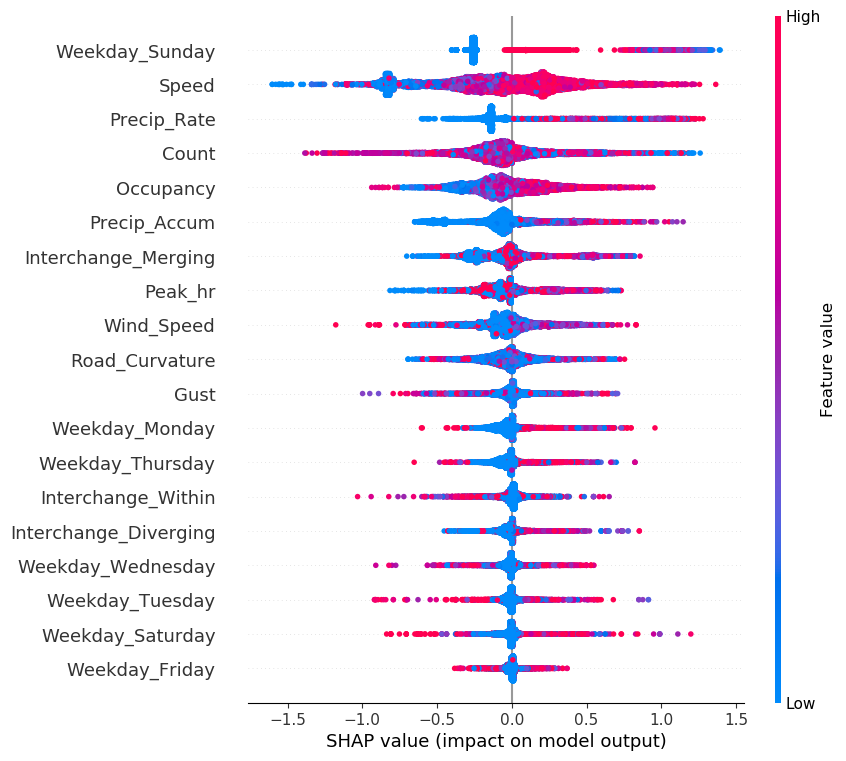

In [185]:
import matplotlib as mpl
from sklearn.model_selection import train_test_split

%matplotlib inline
mpl.rcParams['figure.dpi'] = 100

import shap
import matplotlib.pyplot as pl
names = {1:'Non-Crash', 2:'Rear End', 3:'Sideswipe-Same Direction', 4:'Angle', 5:'Single-vehicle'}

y = y
labelx = ['Non-Crash','Rear End','Angle','Sideswipe Same Direction', 'Single-vehicle']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.8, random_state=0)
plt.rcParams['figure.figsize'] = [15, 5]

explainer = shap.TreeExplainer(XGBmodel)
shap_values = explainer.shap_values(X,approximate=True)
ss = shap.summary_plot(shap_values, X, plot_type="bar", color=pl.get_cmap("tab10"), class_names=labelx)

for class_num in range(len(shap_values)):
    print('############################################ Class ' + str(names[class_num + 1]) + ' ############################################')
    shap.summary_plot(shap_values[class_num], X)

In [ ]:
shap_sum = np.abs(shap_values[0]).mean(axis=0)
importance_df = pd.DataFrame([X_importance.columns.tolist(), shap_sum.tolist()]).T
importance_df.columns = ['column_name', 'shap_importance']
importance_df = importance_df.sort_values('shap_importance', ascending=False)
importance_df

In [178]:
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], X)

shap.force_plot is slow for many thousands of rows, try subsampling your data.


In [ ]:
shap_sum = np.abs(shap_values).mean(axis=0)
importance_df = pd.DataFrame([X_importance.columns.tolist(), shap_sum.tolist()]).T
importance_df.columns = ['column_name', 'shap_importance']
importance_df = importance_df.sort_values('shap_importance', ascending=False)
importance_df

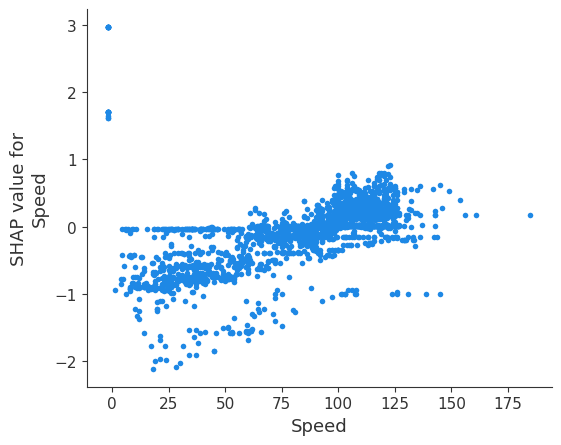

In [119]:
# shap.summary_plot(shap_values[1], X_test)
shap.dependence_plot(4, shap_values[0], X_test, interaction_index=None)

In [157]:
features.index

Int64Index([ 2861,  4439,  1121,  6281,  5178,  2043,  7198,  9323,  8570,
             4943,  4055,  6605,  2869,  9735,  9002,  7559,  2712,  1220,
            10036,  9847],
           dtype='int64')

In [165]:
import warnings
explainer = shap.TreeExplainer(XGBmodel)
expected_value = explainer.expected_value
if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")


select = range(20)
features = X.iloc[select]
features_display = X.loc[features.index]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


Explainer expected value: [0.42857918 0.46980624 0.47215093 0.48692959 0.48349827]


In [2]:
row_index = 2
shap.multioutput_decision_plot(heart_base_values, heart_shap_values,
                               row_index=row_index, 
                               feature_names=heart_feature_names, 
                               highlight=[np.argmax(heart_predictions[row_index])],
                               legend_labels=class_labels(row_index),
                               legend_location='lower right')  

In [170]:
features_display

,Wind_Speed,Gust,Precip_Rate,Precip_Accum,Speed,Road_Curvature,Interchange_Within,Peak_hr,Interchange_Diverging,Interchange_Merging,Count,Occupancy,Weekday_Tuesday,Weekday_Monday,Weekday_Friday,Weekday_Wednesday,Weekday_Sunday,Weekday_Thursday,Weekday_Saturday
0,1.6,3.1,0.00,0.00,126.0,0.00000,0.0,0.0,0.0,0.0,5.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.7,0.0,0.00,0.00,112.0,0.00017,0.0,0.0,1.0,0.0,19.0,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,2.0,0.0,0.00,0.04,105.0,0.00311,0.0,1.0,0.0,0.0,6.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.00,0.79,108.0,0.00086,0.0,1.0,0.0,0.0,37.0,5.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
4,1.4,3.1,0.00,0.00,112.0,0.00086,0.0,0.0,0.0,0.0,14.0,5.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
5,4.2,0.0,0.00,0.00,117.0,0.00000,0.0,1.0,0.0,0.0,21.0,7.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
6,4.0,0.0,0.00,0.00,91.0,0.00519,0.0,0.0,0.0,0.0,25.0,13.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
7,1.2,3.8,0.01,0.08,117.0,0.00126,0.0,0.0,1.0,0.0,16.0,5.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
8,0.0,0.0,0.00,0.01,107.0,0.00000,0.0,1.0,1.0,0.0,26.0,12.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
9,0.0,0.0,0.00,0.00,99.0,0.00024,0.0,0.0,0.0,0.0,37.0,17.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0


In [1]:
def ABS_SHAP(df_shap,df):
    #import matplotlib as plt
    # Make a copy of the input data
    shap_v = pd.DataFrame(df_shap)
    feature_list = df.columns
    shap_v.columns = feature_list
    df_v = df.copy().reset_index().drop('index',axis=1)
    
    # Determine the correlation in order to plot with different colors
    corr_list = list()
    for i in feature_list:
        b = np.corrcoef(shap_v[i],df_v[i])[1][0]
        corr_list.append(b)
    corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
    # Make a data frame. Column 1 is the feature, and Column 2 is the correlation coefficient
    corr_df.columns  = ['Variable','Corr']
    corr_df['Sign'] = np.where(corr_df['Corr']>0,'red','blue')
    
    # Plot it
    shap_abs = np.abs(shap_v)
    k=pd.DataFrame(shap_abs.mean()).reset_index()
    k.columns = ['Variable','SHAP_abs']
    k2 = k.merge(corr_df,left_on = 'Variable',right_on='Variable',how='inner')
    k2 = k2.sort_values(by='SHAP_abs',ascending = True)
    colorlist = k2['Sign']
    ax = k2.plot.barh(x='Variable',y='SHAP_abs',color = colorlist, figsize=(5,6),legend=False)
    ax.set_xlabel("SHAP Value (Red = Positive Impact)")
    
ABS_SHAP(shap_values[0],X_train)

In [247]:
shap_v = pd.DataFrame(shap_values[3])
feature_list = X.columns
shap_v.columns = feature_list
df_v = X.copy().reset_index().drop('index',axis=1)


corr_list = list()
i = 0
for item in feature_list:
    b = np.corrcoef(shap_v.iloc[:,i],df_v.iloc[:,i])[1][0]
    i += 1
    corr_list.append(b)
corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
corr_df[1] = (corr_df[1]-corr_df[1].mean())/corr_df[1].std()
corr_df
corr_df1 = corr_df

In [248]:
shap_v = pd.DataFrame(shap_values[2])
feature_list = X.columns
shap_v.columns = feature_list
df_v = X.copy().reset_index().drop('index',axis=1)


corr_list = list()
i = 0
for item in feature_list:
    b = np.corrcoef(shap_v.iloc[:,i],df_v.iloc[:,i])[1][0]
    i += 1
    corr_list.append(b)
corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_list)],axis=1).fillna(0)
corr_df[1] = (corr_df[1]-corr_df[1].mean())/corr_df[1].std()
corr_df
corr_dfSSD = corr_df

In [249]:
corr_df = pd.concat([pd.Series(feature_list),pd.Series(corr_df1[1]-corr_dfSSD[1])],axis=1).fillna(0)

In [250]:
corr_df.to_csv('Result.csv')

In [259]:

total = pd.DataFrame()
total['column_name'] = X.columns.tolist()
for name, num in zip(['non_crash','rear_end','ssd','angle','single'],[0,1,2,3,4]):
    shap_sum = (shap_values[num]).mean(axis=0)
    shap_var = (shap_values[num]).var(axis=0)
    df = pd.DataFrame([X.columns.tolist(), shap_sum.tolist(), shap_var.tolist()]).T
    df.columns = ['column_name', 'shap_importance', 'var']
    total[name] = df['shap_importance']
    total[name+'_var'] = df['var']
    # importance_df = importance_df.sort_values('shap_importance', ascending=False)
    # importance_df.shap_importance=(importance_df.shap_importance-importance_df.shap_importance.mean())/importance_df.shap_importance.std()

total2 = total.copy()

In [260]:
t_stats = pd.DataFrame()
t_stats['column_name'] = X.columns.tolist()
import math
for name, num in zip(['non_crash','rear_end','ssd','angle','single'],[0,1,2,3,4]):
    test_stats = []
    for row in total.iterrows():
        row = row[1][1:]
        means = row[::2]
        varrs = row[1::2]

        xbar = means[num]
        xother = means.drop(means.index[num]).sum()
        sd = math.sqrt(varrs.sum())

        t = (xbar - xother)/sd
        test_stats.append(t)
        
    t_stats[name+'_t'] = test_stats

In [266]:
t_stats

,column_name,non_crash_t,rear_end_t,ssd_t,angle_t,single_t
0,Wind_Speed,0.957483,0.167707,-0.146841,0.126238,0.077970
1,Gust,0.360016,0.153121,-0.964638,0.075653,0.126549
2,Precip_Rate,0.363287,0.114386,-1.259502,0.127833,0.014987
3,Precip_Accum,0.843915,0.163827,-0.370873,0.085722,0.090313
4,Speed,0.993692,0.255148,1.757961,0.245112,0.207272
5,Road_Curvature,0.376748,0.165525,0.383680,0.150616,0.175757
6,Interchange_Within,-1.221949,0.124283,0.008571,0.117144,0.153181
7,Peak_hr,1.037141,0.073223,1.218934,0.101836,0.167815
8,Interchange_Diverging,-1.793339,0.088278,0.034405,0.137091,0.142325
9,Interchange_Merging,-2.592113,0.203530,2.070851,0.220282,0.236397


In [265]:
t_stats['non_crash_t'] = (t_stats['non_crash_t'] - t_stats['non_crash_t'].mean())/(t_stats['non_crash_t'].std())

In [258]:
t_stats['non_crash_t'] - t_stats['ssd_t']

0     1.104324
1     1.324654
2     1.622788
3     1.214789
4    -0.764269
5    -0.006932
6    -1.230520
7    -0.181793
8    -1.827744
9    -4.662965
10   -1.142205
11   -2.260268
12    0.874633
13    0.920341
14    1.083022
15    0.912857
16    1.360548
17    0.657849
18    1.000891
dtype: float64

In [ ]:
###########################################################################
#                     Correlation Matrix Heatmap                          #
###########################################################################
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
f, ax = plt.subplots(figsize=(20, 10))
corr = Outerdata.corr()
hm = sns.heatmap(round(corr,2), annot=True, ax=ax, cmap="coolwarm",fmt='.2f', linewidths=1, annot_kws={"size": 12})
f.subplots_adjust(top=0.93)
hm.tick_params(labelsize=13)

In [ ]:
X = Outerdata.drop(['Crash'], 1)
y = Outerdata['Crash']

score_table = pd.DataFrame()

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [ ]:
score_table = pd.DataFrame()
XGBmodel = fast_boost(X_train, y_train, X_test, y_test)

In [ ]:
NUM_TRIALS = 8
nested_scores = np.zeros([NUM_TRIALS,5])

for SIZE in [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]:
    i = (SIZE*10 - 3)
    crash_sized = crash.sample(frac = SIZE)
    PoolNONCrash = non_crash.sample(n=crash_sized.shape[0])
    Outerdata = pd.concat([PoolNONCrash, crash_sized])
    
    X = Outerdata.drop(['Crash'], 1)
    y = Outerdata['Crash']
    score_table = pd.DataFrame()
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)
    XGBmodel, results = fast_boost(X_train, y_train, X_test, y_test)
    nested_scores[int(i)] = results

In [ ]:
# plt.figure()
# plt.subplot(211)
# non_nested_scores_line, = plt.plot(non_nested_scores, color='r')
plt.subplots(figsize=(20, 10))
f1, = plt.plot(nested_scores[:,0], color='b')
ROC_AUC, = plt.plot(nested_scores[:,4], color='r')
plt.ylabel("score", fontsize="14")
plt.legend([f1, ROC_AUC],
           ["F1", "ROC_AUC"],
           bbox_to_anchor=(0, .2, .7, 0))
plt.title("f1 and ROC_AUC on Dataset with nested cv",
          x=.5, y=1.0, fontsize="15")
plt.xticks(np.arange(8), ('30%','40%','50%','60%', '70%','80%','90%','100%'))

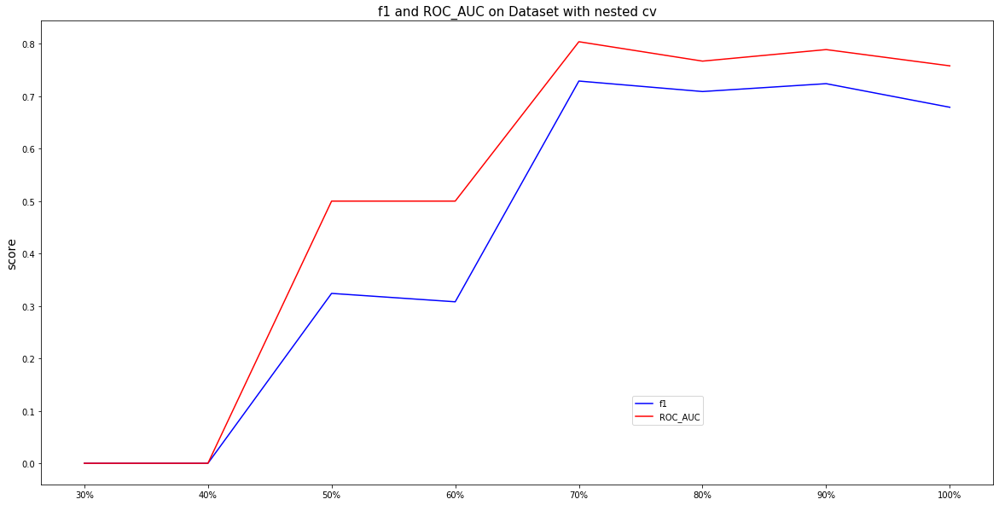

In [ ]:
###########################################################################
#                               Pull Data                                 #
###########################################################################
Type = 'Kmeans1'

###########################################################################
#                            SKdown Sampled                               #
###########################################################################
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ML DS
path2file = 'H:\\Pickles\\ML_Stratified\\V2\\'+ Type + '\\'
# R DS
# path2file = 'H:\\Pickles\\RandomSampled\\'+ Type + '\\'

names = ['X_test.csv','y_test.csv']
file_obj = open(path2file + names[0], encoding="utf-8")
X = pd.read_csv(file_obj, low_memory=False, index_col=0)
file_obj = open(path2file + names[1], encoding="utf-8")
y = pd.read_csv(file_obj, low_memory=False, index_col=0, header=None)
y = y[1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
XGBmodel = fast_boost(X_train, y_train, X_test, y_test)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
XGBmodel = fast_boost(X_train, y_train, X_test, y_test)

In [ ]:
###########################################################################
#                               Pull Data                                 #
###########################################################################
Type = 'Kmeans2'

###########################################################################
#                            SKdown Sampled                               #
###########################################################################
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ML DS
path2file = 'H:\\Pickles\\ML_Stratified\\V2\\'+ Type + '\\'
# R DS
# path2file = 'H:\\Pickles\\RandomSampled\\'+ Type + '\\'

names = ['X_test.csv','y_test.csv']
file_obj = open(path2file + names[0], encoding="utf-8")
X = pd.read_csv(file_obj, low_memory=False, index_col=0)
file_obj = open(path2file + names[1], encoding="utf-8")
y = pd.read_csv(file_obj, low_memory=False, index_col=0, header=None)
y = y[1]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
XGBmodel = fast_boost(X_train, y_train, X_test, y_test)

In [ ]:
Type = 'SMOTEL'
###########################################################################
#                            SKdown Sampled                               #
###########################################################################
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ML DS
path2file = 'H:\\Pickles\\ML_Stratified\\Small\\'+ Type + '\\'
# R DS
# path2file = 'H:\\Pickles\\RandomSampled\\'+ Type + '\\'

names = ['X_test.csv','y_test.csv', 'Full.csv']
file_obj = open(path2file + names[0], encoding="utf-8")
X = pd.read_csv(file_obj, low_memory=False, index_col=0)
file_obj = open(path2file + names[1], encoding="utf-8")
y = pd.read_csv(file_obj, low_memory=False, index_col=0)

file_obj = open(path2file + names[2], encoding="utf-8")
Full = pd.read_csv(file_obj, low_memory=False, index_col=0)

In [ ]:
TestPool = df[~df.index.isin(Full.index.to_list())]

In [ ]:
TestPoolCrash = TestPool[TestPool['Crash'] == 1]
TestPoolNONCrash = TestPool[TestPool['Crash'] == 0]

In [ ]:
TestPoolCrash.shape
TestNONCrash = TestPoolNONCrash.sample(n=TestPoolCrash.shape[0])
testsetter = pd.concat([TestNONCrash, TestPoolCrash])
X_testN = testsetter.drop(['Crash'],1)
y_testN = testsetter[['Crash']]

X_trainN = X
y_trainN = y['Crash']

In [ ]:
XGBmodel = fast_boost(X_trainN, y_trainN, X_testN, y_testN)

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
def Knear(X_train, y_train, X_test, y_test):
    # Create a KNN Classifier
    knn = KNeighborsClassifier()

    # Hyperparameter Optimization
    parameters = {'n_neighbors': [3, 4, 5, 10], 
                  'weights': ['uniform', 'distance'],
                  'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
                  'leaf_size' : [10, 20, 30, 50]
                 }

    # Run the grid search
    grid_obj = GridSearchCV(knn, parameters)
    grid_obj = grid_obj.fit(X_train, y_train)

    # Set the knn to the best combination of parameters
    knn = grid_obj.best_estimator_

    # Train the model using the training sets 
    knn.fit(X_train,y_train)
    
    # Prediction on test data
    y_pred = knn.predict(X_test)
    
    # Confusion matrix and test 
    draw_cm(y_test, y_pred)
    Modeltest(X_test, y_test, y_pred, knn, 'K - Nearest Neighbors', SVM = False)

    return knn

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_validate
from sklearn.neighbors import KNeighborsClassifier
def evaluate(model, params, X, y):
    n_splits = 5
    n_repeats = 5
    cv = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats)
    X_train_outter, X_test_outter, y_train_outter, y_test_outter = train_test_split(X, y, test_size=0.2)


    clf = GridSearchCV(model, params, cv=cv, scoring='accuracy')
    clf.fit(X_train_outter, y_train_outter)

    scoring = {
        'accuracy':  metrics.make_scorer(metrics.accuracy_score),
        'f1':        metrics.make_scorer(metrics.f1_score),
        'precision': metrics.make_scorer(metrics.precision_score),
        'recall':    metrics.make_scorer(metrics.recall_score)}
    
    validation = cross_validate(clf.best_estimator_, X_test_outter, y_test_outter, scoring=scoring, cv=cv)
    scores = { score: [np.mean(validation['test_{}'.format(score)])] for score in scoring.keys() }

    return (clf.best_estimator_, scores)

################################################################################

#--- 0uter loop data ---#

from sklearn.tree import DecisionTreeClassifier
model = KNeighborsClassifier()

params = {'n_neighbors': [4, 5, 10, 12, 15, 20, 25, 30, 40 ,50], 
                  'weights': ['uniform', 'distance'],
                  'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute'],
                  'leaf_size' : [10, 20, 30, 50]}

repeat = 10
# _, ax = plt.subplots(nrows=repeat, ncols=2)
# axes = list(it.chain(*ax))
non_nested_scores = np.zeros(repeat)
for i in range(0,repeat):
    
    model, scores = evaluate(model, params, X, y)
#     print(params)
    print(model)
    print(scores)
#     importance = pd.DataFrame(index=[X.columns],data={'Importance': model.feature_importances_})
#     importance = importance[importance['Importance'] > 0].sort_values(by=['Importance'], ascending=False)
#     print(importance)
    
Scores = pd.DataFrame()

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_validate

def evaluate(model, params, X_train_outter, X_test_outter, y_train_outter, y_test_outter):
    n_splits = 5
    n_repeats = 5
    cv = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats)
    X_train_outter, X_test_outter, y_train_outter, y_test_outter = train_test_split(X, y, test_size=0.2)


    clf = GridSearchCV(model, params, cv=cv, scoring='accuracy')
    clf.fit(X_train_outter, y_train_outter)

    scoring = {
        'accuracy':  metrics.make_scorer(metrics.accuracy_score),
        'f1':        metrics.make_scorer(metrics.f1_score),
        'precision': metrics.make_scorer(metrics.precision_score),
        'recall':    metrics.make_scorer(metrics.recall_score)}
    
    validation = cross_validate(clf.best_estimator_, X_test_outter, y_test_outter, scoring=scoring, cv=cv)
    scores = { score: [np.mean(validation['test_{}'.format(score)])] for score in scoring.keys() }

    return (clf.best_estimator_, scores)

################################################################################

#--- 0uter loop data ---#

from sklearn.tree import DecisionTreeClassifier
model = RandomForestClassifier()

params = {'n_estimators': [4, 6, 9, 10, 15, 20, 25, 50], 
                  'max_features': ['log2', 'sqrt','auto'], 
                  'criterion': ['entropy', 'gini'],
                  'max_depth': [2, 3, 4, 5, 7, 10], 
                  'min_samples_split': [2, 3, 5],
                  'min_samples_leaf': [1, 5, 8]
                 }

repeat = 10
# _, ax = plt.subplots(nrows=repeat, ncols=2)
# axes = list(it.chain(*ax))
non_nested_scores = np.zeros(repeat)
for i in range(0,repeat):
    
    model, scores = evaluate(model, params, X_train, X_test, y_train, y_test)
#     print(params)
    print(model)
    y_pred = model.predict(X_test)
    
#     draw_cm(y_test, y_pred)
    acc_nb = round(metrics.accuracy_score(y_test, y_pred) * 100, 2 )
    print('Total Accuracy: ', acc_nb )
    
    from sklearn.metrics import confusion_matrix
    confusion = confusion_matrix(y_test, y_pred)
    
    print('Confusion Matrix\n')
    print(confusion)

    #importing accuracy_score, precision_score, recall_score, f1_score
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
    print('\nAccuracy: {:.2f}\n'.format(accuracy_score(y_test, y_pred)))

    print('Micro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='micro')))
    print('Micro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='micro')))
    print('Micro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='micro')))

    print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
    print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
    print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))
    
    print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
    print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
    print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))
    
    print('Macro Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='macro')))
    print('Macro Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='macro')))
    print('Macro F1-score: {:.2f}\n'.format(f1_score(y_test, y_pred, average='macro')))

    print('Weighted Precision: {:.2f}'.format(precision_score(y_test, y_pred, average='weighted')))
    print('Weighted Recall: {:.2f}'.format(recall_score(y_test, y_pred, average='weighted')))
    print('Weighted F1-score: {:.2f}'.format(f1_score(y_test, y_pred, average='weighted')))

    from sklearn.metrics import classification_report
    print('\nClassification Report\n')
    print(classification_report(y_test, y_pred, target_names=['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5']))
    
Scores = pd.DataFrame()

In [94]:
###########################################################################
#                               Even Split                                #
###########################################################################
non_crash = df[df['Crash'] == 0]
crash = df[df['Crash'] != 0]
PoolNONCrash = non_crash.sample(n=int(crash.shape[0]))

PoolNONCrash = PoolNONCrash[PoolNONCrash['Crash'] == 0]
Rear_end = df[df['Crash'] == 1]
SSS = df[df['Crash'] == 2]
Angle = df[df['Crash'] == 3]
Single = df[df['Crash'] == 4]

PoolNONCrash = PoolNONCrash.sample(n = Rear_end.shape[0])
# Rear_end = Rear_end.sample(frac = (1 - 150/len(Rear_end)))
# SSS = SSS.sample(frac = (1 - (150/len(SSS))))
# Angle = Angle.sample(frac = (1 - 75/len(Angle)))
# Single = Single.sample(frac = (1 - 75/len(Single)))

DownSample = pd.concat([PoolNONCrash, Rear_end, SSS, Angle, Single])

In [ ]:
lister = ['Wind_Speed', 'Gust', 'Precip_Rate', 'Precip_Accum',
 'Speed', 'Road_Curvature', 'Crash', 'Interchange_Within', 'Peak_hr',
 'Interchange_Diverging', 'Interchange_Merging', 'Count', 'Occupancy',
 'Weekday_Tuesday', 'Weekday_Monday', 'Weekday_Friday','Weekday_Wednesday',
 'Weekday_Sunday', 'Weekday_Thursday','Weekday_Saturday']

b0 = []
b1 = []
b2 = []
b3 = []
b4 = []

Dicter = {'NON_CRASH': b0, 'REAR_END': b1, 'SDS': b2, 'ANGLE': b3, 'SINGLE': b4}

for y in ['NON_CRASH', 'REAR_END', 'SDS', 'ANGLE', 'SINGLE']:
    for x in lister:
        name = 'B_' + x + '_' + y + ' = Beta(\'B_' + x + '_' + y + '\',0,None,None,0)'
        print(name)
        Dicter[y].append('B_' + x + '_' + y)
    print('#####################################################################################')

In [ ]:
dicter = dict(zip(['V1','V2','V3','V4','V5'],[b0,b1,b2,b3,b4]))

for v, y in zip(['V1','V2','V3','V4','V5'],['NON_CRASH', 'REAR_END', 'SDS', 'ANGLE', 'SINGLE']):
    basic = v + ' = ASC_' + y
    ITEMS = ''
    for item, beta in zip(lister, dicter[v]):
        ITEMS = ITEMS + ' + ' + beta + '*' + item
    print(basic + ITEMS)
    print('#####################################################')

In [61]:
Type = 'RANDOM_ON_80%'
###########################################################################
#                            SKdown Sampled                               #
###########################################################################
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ML DS
path2file = 'H:\\Pickles\\Updated\\Oversample\\'+ Type + '\\'
# R DS
# path2file = 'H:\\Pickles\\RandomSampled\\'+ Type + '\\'

names = ['X_test.csv','y_test.csv', 'Full.csv']
file_obj = open(path2file + names[0], encoding="utf-8")
X = pd.read_csv(file_obj, low_memory=False, index_col=0)
file_obj = open(path2file + names[1], encoding="utf-8")
y = pd.read_csv(file_obj, low_memory=False, index_col=0)

file_obj = open(path2file + names[2], encoding="utf-8")
Full = pd.read_csv(file_obj, low_memory=False, index_col=0)

In [97]:
###########################################################################
#                          Select test data                               #
###########################################################################
TestPool = df[~df.index.isin(Full.index.to_list())]
TestPoolNONCrash = TestPool[TestPool['Crash'] == 0]
Test_Rear_end = TestPool[TestPool['Crash'] == 1]
Test_SSS = TestPool[TestPool['Crash'] == 2]
Test_Angle = TestPool[TestPool['Crash'] == 3]
Test_Single = TestPool[TestPool['Crash'] == 4]

TestNONCrash = TestPoolNONCrash.sample(n=Test_Rear_end.shape[0])
testsetter = pd.concat([TestNONCrash, Test_Rear_end, Test_SSS, Test_Angle, Test_Single])
X_test = testsetter.drop(['Crash'],1)
y_test = testsetter[['Crash']]

X_train = X
y_train = y['Crash']

In [98]:
#New Methode Test
DownSample = X_test
DownSample['Crash'] = y_test

In [141]:
###########################################################################
#                               Even Split                                #
###########################################################################
non_crash = df[df['Crash'] == 0]
crash = df[df['Crash'] != 0]
PoolNONCrash = non_crash.sample(n=int(crash.shape[0]))

# PoolNONCrash = PoolNONCrash[PoolNONCrash['Crash'] == 0]
Rear_end = df[df['Crash'] == 1]
SSS = df[df['Crash'] == 2]
Angle = df[df['Crash'] == 3]
Single = df[df['Crash'] == 4]

# PoolNONCrash = PoolNONCrash.sample(n = Rear_end.shape[0])
# Rear_end = Rear_end.sample(frac = (1 - 150/len(Rear_end)))
# SSS = SSS.sample(frac = (1 - (150/len(SSS))))
# Angle = Angle.sample(frac = (1 - 75/len(Angle)))
# Single = Single.sample(frac = (1 - 75/len(Single)))

DownSample = pd.concat([PoolNONCrash, Rear_end, SSS, Angle, Single])

DownSampleTEST = pd.concat([PoolNONCrash.sample(n = 444),
                            Rear_end.sample(frac =.2),
                            SSS.sample(frac =.2),
                            Angle.sample(frac =.2),
                            Single.sample(frac =.2)])
TrainPool = DownSample[~DownSample.index.isin(DownSampleTEST.index.to_list())]

#New Methode Train

X_test = DownSampleTEST.drop(['Crash'],1)
y_test = DownSampleTEST[['Crash']]

X_train = TrainPool.drop(['Crash'],1)
y_train = TrainPool[['Crash']]

In [175]:
TestPoolNONCrash = df[df['Crash'] == 0]
Test_Rear_end = df[df['Crash'] == 1]
Test_SSS = df[df['Crash'] == 2]
Test_Angle = df[df['Crash'] == 3]
Test_Single = df[df['Crash'] == 4]

TestNONCrash = TestPoolNONCrash.sample(n=Test_Rear_end.shape[0])
testsetter = pd.concat([TestNONCrash, Test_Rear_end, Test_SSS, Test_Angle, Test_Single])

In [176]:
testsetter

(6273, 20)

In [211]:
#New Methode Train
DownSample = testsetter

In [212]:
testsetter['Crash'].value_counts()

1    2220
0    2220
2    1112
3     394
4     327
Name: Crash, dtype: int64

In [213]:
import numpy as np
import pandas as pd
import biogeme.database as db
import biogeme.models as models
import matplotlib.pyplot as plt
import biogeme.biogeme as bio


from sklearn.preprocessing import MinMaxScaler
scaled_features = DownSample.copy()

col_names = ['Wind_Speed', 'Gust', 'Precip_Rate',
       'Precip_Accum', 'Speed', 'Road_Curvature','Count', 'Occupancy']

features = scaled_features[col_names]

x = features.values
min_max_scaler = MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
DownSample[col_names] = x_scaled

#####################################################
# Singledf = df[df['MannerOfCo'] == 4]
# df = df[df['MannerOfCo'] != 4]
#####################################################
DownSample = DownSample.applymap(lambda x: float(x))

D2 = DownSample
D2['Crash'] = D2['Crash'] + 1

database = db.Database('New', D2)
from biogeme.expressions import Beta, DefineVariable

globals().update(database.variables)

ASC_NON_CRASH = Beta('ASC_NON_CRASH',0,None,None,0)  
ASC_REAR_END = Beta('ASC_REAR_END',0,None,None,0)
ASC_SDS = Beta('ASC_SDS',0,None,None,0)
ASC_ANGLE = Beta('ASC_ANGLE',0,None,None,0)
ASC_SINGLE = Beta('ASC_SINGLE',0,None,None,1)

# MU = Beta('MU',0.5,0.0,10.0,0)

#MOC0
##########################################################
B_Wind_Speed_NON_CRASH = Beta('B_Wind_Speed_NON_CRASH',0,None,None,0)
B_Gust_NON_CRASH = Beta('B_Gust_NON_CRASH',0,None,None,0)
B_Precip_Rate_NON_CRASH = Beta('B_Precip_Rate_NON_CRASH',0,None,None,0)
B_Precip_Accum_NON_CRASH = Beta('B_Precip_Accum_NON_CRASH',0,None,None,0)
B_Speed_NON_CRASH = Beta('B_Speed_NON_CRASH',0,None,None,0)
B_Road_Curvature_NON_CRASH = Beta('B_Road_Curvature_NON_CRASH',0,None,None,0)
# B_Crash_NON_CRASH = Beta('B_Crash_NON_CRASH',0,None,None,0)
B_Interchange_Within_NON_CRASH = Beta('B_Interchange_Within_NON_CRASH',0,None,None,0)
B_Peak_hr_NON_CRASH = Beta('B_Peak_hr_NON_CRASH',0,None,None,0)
B_Interchange_Diverging_NON_CRASH = Beta('B_Interchange_Diverging_NON_CRASH',0,None,None,0)
B_Interchange_Merging_NON_CRASH = Beta('B_Interchange_Merging_NON_CRASH',0,None,None,0)
B_Count_NON_CRASH = Beta('B_Count_NON_CRASH',0,None,None,0)
B_Occupancy_NON_CRASH = Beta('B_Occupancy_NON_CRASH',0,None,None,0)
B_Weekday_Tuesday_NON_CRASH = Beta('B_Weekday_Tuesday_NON_CRASH',0,None,None,0)
B_Weekday_Monday_NON_CRASH = Beta('B_Weekday_Monday_NON_CRASH',0,None,None,0)
B_Weekday_Friday_NON_CRASH = Beta('B_Weekday_Friday_NON_CRASH',0,None,None,0)
B_Weekday_Wednesday_NON_CRASH = Beta('B_Weekday_Wednesday_NON_CRASH',0,None,None,0)
B_Weekday_Sunday_NON_CRASH = Beta('B_Weekday_Sunday_NON_CRASH',0,None,None,0)
B_Weekday_Thursday_NON_CRASH = Beta('B_Weekday_Thursday_NON_CRASH',0,None,None,0)
B_Weekday_Saturday_NON_CRASH = Beta('B_Weekday_Saturday_NON_CRASH',0,None,None,0)

#MOC1
##########################################################
B_Wind_Speed_REAR_END = Beta('B_Wind_Speed_REAR_END',0,None,None,0)
B_Gust_REAR_END = Beta('B_Gust_REAR_END',0,None,None,0)
B_Precip_Rate_REAR_END = Beta('B_Precip_Rate_REAR_END',0,None,None,0)
B_Precip_Accum_REAR_END = Beta('B_Precip_Accum_REAR_END',0,None,None,0)
B_Speed_REAR_END = Beta('B_Speed_REAR_END',0,None,None,0)
B_Road_Curvature_REAR_END = Beta('B_Road_Curvature_REAR_END',0,None,None,0)
# B_Crash_REAR_END = Beta('B_Crash_REAR_END',0,None,None,0)
B_Interchange_Within_REAR_END = Beta('B_Interchange_Within_REAR_END',0,None,None,0)
B_Peak_hr_REAR_END = Beta('B_Peak_hr_REAR_END',0,None,None,0)
B_Interchange_Diverging_REAR_END = Beta('B_Interchange_Diverging_REAR_END',0,None,None,0)
B_Interchange_Merging_REAR_END = Beta('B_Interchange_Merging_REAR_END',0,None,None,0)
B_Count_REAR_END = Beta('B_Count_REAR_END',0,None,None,0)
B_Occupancy_REAR_END = Beta('B_Occupancy_REAR_END',0,None,None,0)
B_Weekday_Tuesday_REAR_END = Beta('B_Weekday_Tuesday_REAR_END',0,None,None,0)
B_Weekday_Monday_REAR_END = Beta('B_Weekday_Monday_REAR_END',0,None,None,0)
B_Weekday_Friday_REAR_END = Beta('B_Weekday_Friday_REAR_END',0,None,None,0)
# B_Weekday_Wednesday_REAR_END = Beta('B_Weekday_Wednesday_REAR_END',0,None,None,0)
B_Weekday_Sunday_REAR_END = Beta('B_Weekday_Sunday_REAR_END',0,None,None,0)
B_Weekday_Thursday_REAR_END = Beta('B_Weekday_Thursday_REAR_END',0,None,None,0)
B_Weekday_Saturday_REAR_END = Beta('B_Weekday_Saturday_REAR_END',0,None,None,0)

#MOC2
##########################################################
B_Wind_Speed_SDS = Beta('B_Wind_Speed_SDS',0,None,None,0)
B_Gust_SDS = Beta('B_Gust_SDS',0,None,None,0)
B_Precip_Rate_SDS = Beta('B_Precip_Rate_SDS',0,None,None,0)
B_Precip_Accum_SDS = Beta('B_Precip_Accum_SDS',0,None,None,0)
B_Speed_SDS = Beta('B_Speed_SDS',0,None,None,0)
B_Road_Curvature_SDS = Beta('B_Road_Curvature_SDS',0,None,None,0)
# B_Crash_SDS = Beta('B_Crash_SDS',0,None,None,1)
B_Interchange_Within_SDS = Beta('B_Interchange_Within_SDS',0,None,None,0)
B_Peak_hr_SDS = Beta('B_Peak_hr_SDS',0,None,None,0)
B_Interchange_Diverging_SDS = Beta('B_Interchange_Diverging_SDS',0,None,None,0)
B_Interchange_Merging_SDS = Beta('B_Interchange_Merging_SDS',0,None,None,0)
B_Count_SDS = Beta('B_Count_SDS',0,None,None,0)
B_Occupancy_SDS = Beta('B_Occupancy_SDS',0,None,None,0)
B_Weekday_Tuesday_SDS = Beta('B_Weekday_Tuesday_SDS',0,None,None,0)
B_Weekday_Monday_SDS = Beta('B_Weekday_Monday_SDS',0,None,None,0)
B_Weekday_Friday_SDS = Beta('B_Weekday_Friday_SDS',0,None,None,0)
# B_Weekday_Wednesday_SDS = Beta('B_Weekday_Wednesday_SDS',0,None,None,0)
B_Weekday_Sunday_SDS = Beta('B_Weekday_Sunday_SDS',0,None,None,0)
B_Weekday_Thursday_SDS = Beta('B_Weekday_Thursday_SDS',0,None,None,0)
B_Weekday_Saturday_SDS = Beta('B_Weekday_Saturday_SDS',0,None,None,0)
#MOC3
##########################################################
B_Wind_Speed_ANGLE = Beta('B_Wind_Speed_ANGLE',0,None,None,0)
B_Gust_ANGLE = Beta('B_Gust_ANGLE',0,None,None,0)
B_Precip_Rate_ANGLE = Beta('B_Precip_Rate_ANGLE',0,None,None,0)
B_Precip_Accum_ANGLE = Beta('B_Precip_Accum_ANGLE',0,None,None,0)
B_Speed_ANGLE = Beta('B_Speed_ANGLE',0,None,None,0)
B_Road_Curvature_ANGLE = Beta('B_Road_Curvature_ANGLE',0,None,None,0)
# B_Crash_ANGLE = Beta('B_Crash_ANGLE',0,None,None,0)
B_Interchange_Within_ANGLE = Beta('B_Interchange_Within_ANGLE',0,None,None,0)
B_Peak_hr_ANGLE = Beta('B_Peak_hr_ANGLE',0,None,None,0)
B_Interchange_Diverging_ANGLE = Beta('B_Interchange_Diverging_ANGLE',0,None,None,0)
B_Interchange_Merging_ANGLE = Beta('B_Interchange_Merging_ANGLE',0,None,None,0)
B_Count_ANGLE = Beta('B_Count_ANGLE',0,None,None,0)
B_Occupancy_ANGLE = Beta('B_Occupancy_ANGLE',0,None,None,0)
B_Weekday_Tuesday_ANGLE = Beta('B_Weekday_Tuesday_ANGLE',0,None,None,0)
B_Weekday_Monday_ANGLE = Beta('B_Weekday_Monday_ANGLE',0,None,None,0)
B_Weekday_Friday_ANGLE = Beta('B_Weekday_Friday_ANGLE',0,None,None,0)
# B_Weekday_Wednesday_ANGLE = Beta('B_Weekday_Wednesday_ANGLE',0,None,None,0)
B_Weekday_Sunday_ANGLE = Beta('B_Weekday_Sunday_ANGLE',0,None,None,0)
B_Weekday_Thursday_ANGLE = Beta('B_Weekday_Thursday_ANGLE',0,None,None,0)
B_Weekday_Saturday_ANGLE = Beta('B_Weekday_Saturday_ANGLE',0,None,None,0)

#MOC4
##########################################################
B_Wind_Speed_SINGLE = Beta('B_Wind_Speed_SINGLE',0,None,None,1)
B_Gust_SINGLE = Beta('B_Gust_SINGLE',0,None,None,1)
B_Precip_Rate_SINGLE = Beta('B_Precip_Rate_SINGLE',0,None,None,1)
B_Precip_Accum_SINGLE = Beta('B_Precip_Accum_SINGLE',0,None,None,1)
B_Speed_SINGLE = Beta('B_Speed_SINGLE',0,None,None,1)
B_Road_Curvature_SINGLE = Beta('B_Road_Curvature_SINGLE',0,None,None,1)
# B_Crash_SINGLE = Beta('B_Crash_SINGLE',0,None,None,0)
B_Interchange_Within_SINGLE = Beta('B_Interchange_Within_SINGLE',0,None,None,1)
B_Peak_hr_SINGLE = Beta('B_Peak_hr_SINGLE',0,None,None,1)
B_Interchange_Diverging_SINGLE = Beta('B_Interchange_Diverging_SINGLE',0,None,None,1)
B_Interchange_Merging_SINGLE = Beta('B_Interchange_Merging_SINGLE',0,None,None,1)
B_Count_SINGLE = Beta('B_Count_SINGLE',0,None,None,1)
B_Occupancy_SINGLE = Beta('B_Occupancy_SINGLE',1,None,None,1)
B_Weekday_Tuesday_SINGLE = Beta('B_Weekday_Tuesday_SINGLE',0,None,None,1)
B_Weekday_Monday_SINGLE = Beta('B_Weekday_Monday_SINGLE',0,None,None,1)
B_Weekday_Friday_SINGLE = Beta('B_Weekday_Friday_SINGLE',0,None,None,1)
# B_Weekday_Wednesday_SINGLE = Beta('B_Weekday_Wednesday_SINGLE',0,None,None,0)
B_Weekday_Sunday_SINGLE = Beta('B_Weekday_Sunday_SINGLE',0,None,None,1)
B_Weekday_Thursday_SINGLE = Beta('B_Weekday_Thursday_SINGLE',0,None,None,1)
B_Weekday_Saturday_SINGLE = Beta('B_Weekday_Saturday_SINGLE',0,None,None,1)

# Cost = injury_cost / 11900

V1 = ASC_NON_CRASH + B_Wind_Speed_NON_CRASH*Wind_Speed + B_Gust_NON_CRASH*Gust + \
     B_Precip_Rate_NON_CRASH*Precip_Rate + B_Precip_Accum_NON_CRASH*Precip_Accum + \
     B_Speed_NON_CRASH*Speed + B_Road_Curvature_NON_CRASH*Road_Curvature + \
     B_Interchange_Within_NON_CRASH*Interchange_Within + B_Peak_hr_NON_CRASH*Peak_hr + \
     B_Interchange_Diverging_NON_CRASH*Interchange_Diverging + B_Interchange_Merging_NON_CRASH*Interchange_Merging + \
     B_Count_NON_CRASH*Count + B_Occupancy_NON_CRASH*Occupancy + B_Weekday_Tuesday_NON_CRASH*Weekday_Tuesday + \
     B_Weekday_Monday_NON_CRASH*Weekday_Monday + B_Weekday_Friday_NON_CRASH*Weekday_Friday + \
     B_Weekday_Sunday_NON_CRASH*Weekday_Sunday + \
     B_Weekday_Thursday_NON_CRASH*Weekday_Thursday + B_Weekday_Saturday_NON_CRASH*Weekday_Saturday
#####################################################
V2 = ASC_REAR_END + B_Wind_Speed_REAR_END*Wind_Speed + B_Gust_REAR_END*Gust + \
     B_Precip_Rate_REAR_END*Precip_Rate + B_Precip_Accum_REAR_END*Precip_Accum + \
     B_Speed_REAR_END*Speed + B_Road_Curvature_REAR_END*Road_Curvature + \
     B_Interchange_Within_REAR_END*Interchange_Within + B_Peak_hr_REAR_END*Peak_hr + \
     B_Interchange_Diverging_REAR_END*Interchange_Diverging + B_Interchange_Merging_REAR_END*Interchange_Merging + \
     B_Count_REAR_END*Count + B_Occupancy_REAR_END*Occupancy + B_Weekday_Tuesday_REAR_END*Weekday_Tuesday + \
     B_Weekday_Monday_REAR_END*Weekday_Monday + B_Weekday_Friday_REAR_END*Weekday_Friday + \
     B_Weekday_Sunday_REAR_END*Weekday_Sunday + B_Weekday_Thursday_REAR_END*Weekday_Thursday + \
     B_Weekday_Saturday_REAR_END*Weekday_Saturday
#####################################################
V3 = ASC_SDS + B_Wind_Speed_SDS*Wind_Speed + B_Gust_SDS*Gust + B_Precip_Rate_SDS*Precip_Rate + \
     B_Precip_Accum_SDS*Precip_Accum + B_Speed_SDS*Speed + B_Road_Curvature_SDS*Road_Curvature + \
     B_Interchange_Within_SDS*Interchange_Within + B_Peak_hr_SDS*Peak_hr + \
     B_Interchange_Diverging_SDS*Interchange_Diverging + B_Interchange_Merging_SDS*Interchange_Merging + \
     B_Count_SDS*Count + B_Occupancy_SDS*Occupancy + B_Weekday_Tuesday_SDS*Weekday_Tuesday + \
     B_Weekday_Monday_SDS*Weekday_Monday + B_Weekday_Friday_SDS*Weekday_Friday + \
     B_Weekday_Sunday_SDS*Weekday_Sunday + B_Weekday_Thursday_SDS*Weekday_Thursday + B_Weekday_Saturday_SDS*Weekday_Saturday
#####################################################
V4 = ASC_ANGLE + B_Wind_Speed_ANGLE*Wind_Speed + B_Gust_ANGLE*Gust + B_Precip_Rate_ANGLE*Precip_Rate + \
     B_Precip_Accum_ANGLE*Precip_Accum + B_Speed_ANGLE*Speed + B_Road_Curvature_ANGLE*Road_Curvature + \
     B_Interchange_Within_ANGLE*Interchange_Within + B_Peak_hr_ANGLE*Peak_hr + \
     B_Interchange_Diverging_ANGLE*Interchange_Diverging + B_Interchange_Merging_ANGLE*Interchange_Merging + \
     B_Count_ANGLE*Count + B_Occupancy_ANGLE*Occupancy + B_Weekday_Tuesday_ANGLE*Weekday_Tuesday + \
     B_Weekday_Monday_ANGLE*Weekday_Monday + B_Weekday_Friday_ANGLE*Weekday_Friday + \
     B_Weekday_Sunday_ANGLE*Weekday_Sunday + \
     B_Weekday_Thursday_ANGLE*Weekday_Thursday + B_Weekday_Saturday_ANGLE*Weekday_Saturday
#####################################################
V5 = ASC_SINGLE + B_Wind_Speed_SINGLE*Wind_Speed + B_Gust_SINGLE*Gust + B_Precip_Rate_SINGLE*Precip_Rate + \
     B_Precip_Accum_SINGLE*Precip_Accum + B_Speed_SINGLE*Speed + B_Road_Curvature_SINGLE*Road_Curvature + \
     B_Interchange_Within_SINGLE*Interchange_Within + B_Peak_hr_SINGLE*Peak_hr + \
     B_Interchange_Diverging_SINGLE*Interchange_Diverging + B_Interchange_Merging_SINGLE*Interchange_Merging + \
     B_Count_SINGLE*Count + B_Occupancy_SINGLE*Occupancy + B_Weekday_Tuesday_SINGLE*Weekday_Tuesday + \
     B_Weekday_Monday_SINGLE*Weekday_Monday + B_Weekday_Friday_SINGLE*Weekday_Friday + \
     B_Weekday_Sunday_SINGLE*Weekday_Sunday + B_Weekday_Thursday_SINGLE*Weekday_Thursday + \
     B_Weekday_Saturday_SINGLE*Weekday_Saturday
#####################################################


V = {1: V1, 2: V2, 3: V3, 4: V4, 5: V5}
# always ava
av = {1:1, 2:1, 3:1, 4:1, 5:1}


# V = {1: V1, 2: V2, 3: V3, 4: V4}
# # always ava
# av = {1:1, 2:1, 3:1, 4:1}



Nest_Non_Crash = 1.0, [1] 
Nest_Crash = 1.0, [2,3,4,5] 

nests = Nest_Non_Crash, Nest_Crash

In [214]:
D2['Crash'].value_counts()

2.0    2220
1.0    2220
3.0    1112
4.0     394
5.0     327
Name: Crash, dtype: int64

In [215]:
models.checkValidityNestedLogit(V,nests)

(True, 'The nested logit model is based on a partition. ')

In [216]:
logprob = models.lognested(V,av,nests,Crash)

import biogeme.messaging as msg
logger = msg.bioMessage()
logger.setSilent()

biogeme  = bio.BIOGEME(database,logprob)
biogeme.modelName = "NestedLogit\\logitNEST_MOC_NEW"
results = biogeme.estimate(saveIterations=True)
pandasResults = results.getEstimatedParameters()
print(pandasResults)
print(results)

                                      Value   Std err     t-test  \
ASC_ANGLE                          1.760601  0.424004   4.152323   
ASC_NON_CRASH                      3.929365  0.359662  10.925151   
ASC_REAR_END                       4.031815  0.353753  11.397261   
ASC_SDS                            2.953183  0.368874   8.005933   
B_Count_ANGLE                      0.915480  0.472285   1.938405   
B_Count_NON_CRASH                 -2.100853  0.408682  -5.140551   
B_Count_REAR_END                   1.262231  0.387599   3.256535   
B_Count_SDS                        0.446712  0.406209   1.099710   
B_Gust_ANGLE                       1.101765  0.614457   1.793070   
B_Gust_NON_CRASH                   0.172315  0.542014   0.317917   
B_Gust_REAR_END                    0.044632  0.530767   0.084090   
B_Gust_SDS                        -0.283988  0.555777  -0.510975   
B_Interchange_Diverging_ANGLE      0.310637  0.256565   1.210755   
B_Interchange_Diverging_NON_CRASH -1.084509  0.1

In [217]:
prob_non_crash = models.nested(V,av,nests,1)
prob_rear_end = models.nested(V,av,nests,2)
prob_sideswipe = models.nested(V,av,nests,3)
prob_angle = models.nested(V,av,nests,4)
prob_single = models.nested(V,av,nests,5)


# assumed that stratified sampling has been used.
# here this effectively true. 
simulate = {'prob_non_crash': prob_non_crash,
            'prob_rear_end': prob_rear_end,
            'prob_sideswipe': prob_sideswipe,
            'prob_angle' : prob_angle,
            'prob_single': prob_single}

biogeme  = bio.BIOGEME(database,simulate)
biogeme.modelName = "02nestedSimulation"

In [218]:
import biogeme.results as res
name = 'NestedLogit\\logitNEST_MOC_NEW.pickle'

betas = biogeme.freeBetaNames
results = res.bioResults(pickleFile=name) # ref to the past choice model
betaValues = results.getBetaValues()
simulatedValues = biogeme.simulate(betaValues)
# Calculate confidence intervals
# b = results.getBetasForSensitivityAnalysis(betas,size=100) #size – number of draws. Default: 100.
# left,right = biogeme.confidenceIntervals(b,0.9)

In [219]:
simulatedValues.shape

(6273, 5)

In [220]:
choice = simulatedValues.idxmax(axis=1)
choice


11822020    prob_non_crash
4603970     prob_non_crash
10669448    prob_non_crash
18976384    prob_non_crash
10901681    prob_non_crash
3188960     prob_non_crash
2009129     prob_non_crash
17429394    prob_non_crash
10583176    prob_non_crash
11056540    prob_non_crash
14630450    prob_non_crash
4253337     prob_non_crash
970092       prob_rear_end
18068070     prob_rear_end
19628901    prob_non_crash
8520229      prob_rear_end
14929961     prob_rear_end
11701163     prob_rear_end
6650713      prob_rear_end
15443221    prob_non_crash
3712851      prob_rear_end
792117      prob_non_crash
18852097    prob_non_crash
4117949     prob_non_crash
6508162      prob_rear_end
12486301    prob_non_crash
10623434    prob_non_crash
12013059    prob_non_crash
6650411      prob_rear_end
12559171    prob_non_crash
                 ...      
20534279     prob_rear_end
20534302    prob_non_crash
20534308     prob_rear_end
20534344     prob_rear_end
20534350     prob_rear_end
20534368       prob_single
2

In [221]:
choice = simulatedValues.idxmax(axis=1)
choice

choice = choice.map({'prob_non_crash': 1,
            'prob_rear_end': 2,
            'prob_sideswipe': 3,
            'prob_angle' : 4,
            'prob_single': 5})

In [222]:
choice

11822020    1
4603970     1
10669448    1
18976384    1
10901681    1
3188960     1
2009129     1
17429394    1
10583176    1
11056540    1
14630450    1
4253337     1
970092      2
18068070    2
19628901    1
8520229     2
14929961    2
11701163    2
6650713     2
15443221    1
3712851     2
792117      1
18852097    1
4117949     1
6508162     2
12486301    1
10623434    1
12013059    1
6650411     2
12559171    1
           ..
20534279    2
20534302    1
20534308    2
20534344    2
20534350    2
20534368    5
20534369    5
20534372    1
20534378    1
20534387    2
20534405    2
20534414    1
20534417    1
20534426    2
20534438    1
20534441    1
20534444    1
20534445    1
20534455    1
20534459    2
20534471    2
20534479    2
20534481    1
20534494    1
20534498    2
20534501    1
20534513    1
20534515    1
20534516    1
20534519    1
Length: 6273, dtype: int64

In [223]:
from sklearn.metrics import confusion_matrix
confusion = confusion_matrix(DownSample['Crash'], choice)

print('Confusion Matrix\n')
print(confusion)

from sklearn.metrics import classification_report
print(classification_report(DownSample['Crash'], choice, target_names=['Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5']))

Confusion Matrix

[[1675  534    8    0    3]
 [ 626 1583    6    0    5]
 [ 362  734    8    0    8]
 [ 122  268    1    0    3]
 [ 140  167    4    0   16]]
              precision    recall  f1-score   support

     Class 1       0.57      0.75      0.65      2220
     Class 2       0.48      0.71      0.58      2220
     Class 3       0.30      0.01      0.01      1112
     Class 4       0.00      0.00      0.00       394
     Class 5       0.46      0.05      0.09       327

    accuracy                           0.52      6273
   macro avg       0.36      0.30      0.27      6273
weighted avg       0.45      0.52      0.44      6273



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1221: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
